In [1]:
# conda base 

# Data manipulation 
import pandas as pd 
import numpy as np

# Data viz
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px

# class and fams annots and ancestral¶ 

In [2]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot, on = "seq_id")
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot, on = "seq_id")

In [3]:
top18fam = list(df_mbl["protein_family_header"].value_counts()[:19].index)
df_mbl.loc[~df_mbl["protein_family_header"].isin(top18fam), "protein_family_header"] = 'No in top 20'

In [4]:
top18fam = list(df_sbl["protein_family_header"].value_counts()[:19].index)
df_sbl.loc[~df_sbl["protein_family_header"].isin(top18fam), "protein_family_header"] = 'No in top 20'

In [5]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    custom_palette = px.colors.qualitative.Light24
    # custom_palette[0] = "#bbbcbf" 
    # custom_palette[1] = "#edeef2"
    #custom_palette.append("#FB0D0D")
    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 600, width = 700, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Light24,
    hover_data = ["protein_family_header", '#name', "protein_name"])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()


In [6]:
df_mbl.groupby("protein_family_header").count().sort_values("seq", ascending = False)

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,Species,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept
protein_family_header,,,,,,,,,,,,,,,,,,,,,
Other,1676,1676,1676,1676,1676,1676,1676,1676,1676,1676,...,883,1676,1676,1676,1676,1676,1676,1676,1518,1676
No in top 20,201,201,201,201,201,201,201,201,201,201,...,88,201,201,201,201,201,201,201,196,201
BcII,196,196,196,196,196,196,196,196,196,196,...,1,196,196,196,196,196,196,196,196,196
CphA,172,172,172,172,172,172,172,172,172,172,...,0,172,172,172,172,172,172,172,150,172
SER,158,158,158,158,158,158,158,158,158,158,...,0,158,158,158,158,158,158,158,158,158
L1,127,127,127,127,127,127,127,127,127,127,...,1,127,127,127,127,127,127,127,116,127
IMP,91,91,91,91,91,91,91,91,91,91,...,2,91,91,91,91,91,91,91,88,91
VIM,91,91,91,91,91,91,91,91,91,91,...,0,91,91,91,91,91,91,91,89,91
NDM,58,58,58,58,58,58,58,58,58,58,...,0,58,58,58,58,58,58,58,44,58


In [7]:
df_mbl[df_mbl["#name"].str.contains("AIC95013.1|ACQ60975.1")]

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,Species,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept
1544,20.268543,10.577355,seq_14854,AIC95013.1|BLEG-1| SpoIVB peptidase,MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETA...,428,B3-BLEG-1-prot.fasta,BLEG-1,BLEG,Class B,...,NaN,NO_SP,0.999979,0.000019,0.000000,0.000000,0.000000,0.000000,NaN,MLKEGVRYVIGVLFLVCLLFLGFNPQFKQFIDIPTSIVLFEGSETA...
2434,11.127975,5.805800,seq_15744,ACQ60975.1|VarG-1| VarG family subclass B1-lik...,MKLSTLALAPITAALLTFNASAKGHDHDNQRAIFFPGETVQDTVKV...,374,B3-VarG-1-prot.fasta,VarG-1,VarG,Class B,...,NaN,SP,0.000269,0.998802,0.000212,0.000277,0.000217,0.000241,CS pos: 22-23. Pr: 0.9766,KGHDHDNQRAIFFPGETVQDTVKVEVEPSATQSLKLGQKINNLYER...


In [8]:
df_sbl.loc[df_sbl['bla_class'].str.contains("Ancestral"), 'protein_family_header'] = 'Ancestral'

In [9]:
do_iscatter(df_sbl[df_sbl.protein_family_header != "Other"], "protein_family_header") 

In [10]:
do_iscatter(df_mbl, "protein_family_header")

# clust90 SBL-MBL and VarG

In [12]:
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

df_full_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_fulldset_mbl_esm1b.csv") 
df_full_mbl = df_full_mbl.merge(df_annot, on = "seq_id")
df_full_mbl["bla_subclass"] = df_full_mbl["bla_subclass"].replace("Consensus", "Signature")


df_mbl90 =  pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_mbl_esm1b.csv") 
df_mbl90 = df_mbl90.merge(df_annot, on = "seq_id")

df_sbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_sbl_esm1b.csv")
df_sbl90 = df_sbl90.merge(df_annot, on = "seq_id")

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

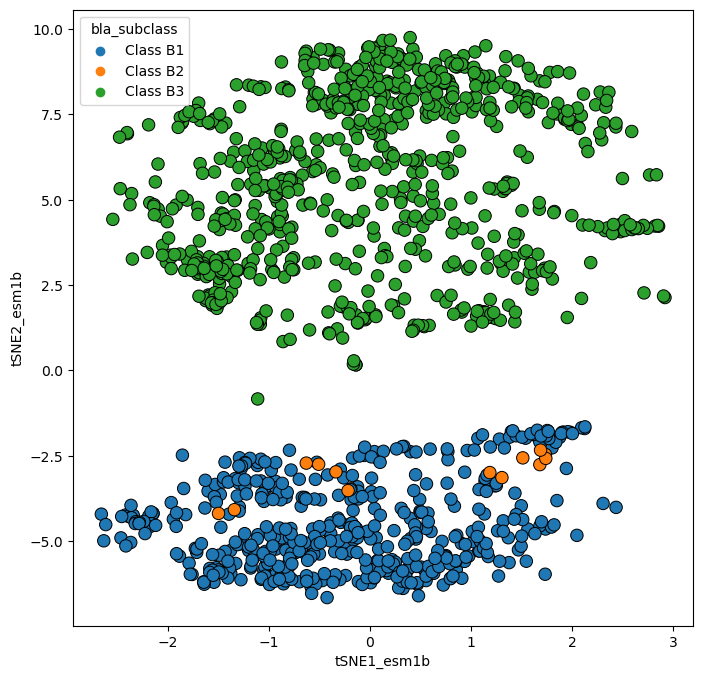

In [13]:
c = "bla_subclass"
p = "tab10"
e = "black"

# set the figure composition 
# ax = plt.figure(figsize=(20,10), constrained_layout = True).subplot_mosaic(mosaic) 

plt.figure(figsize=(8,8))
sns.scatterplot(data=df_mbl90, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=c, palette=p, edgecolor=e, s = 80)

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

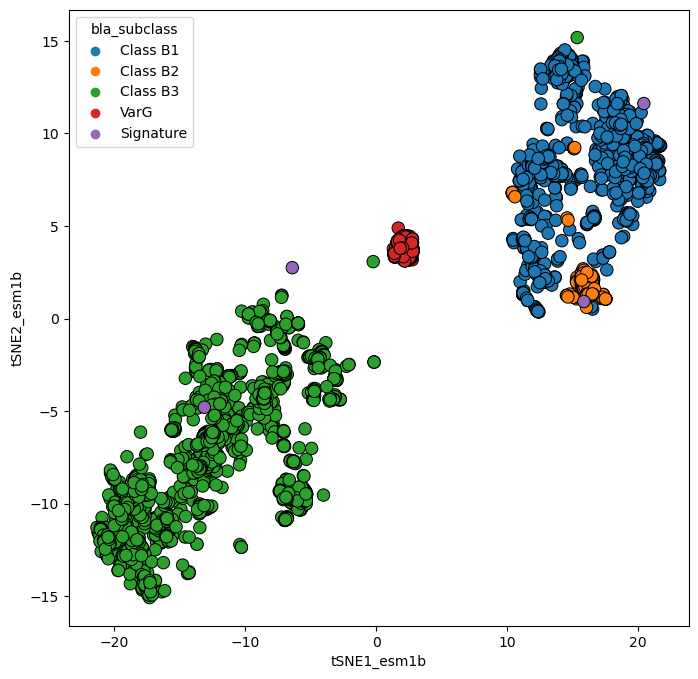

In [14]:
plt.figure(figsize=(8,8))
sns.scatterplot(data=df_full_mbl, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=c, palette=p, edgecolor=e, s = 80)

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

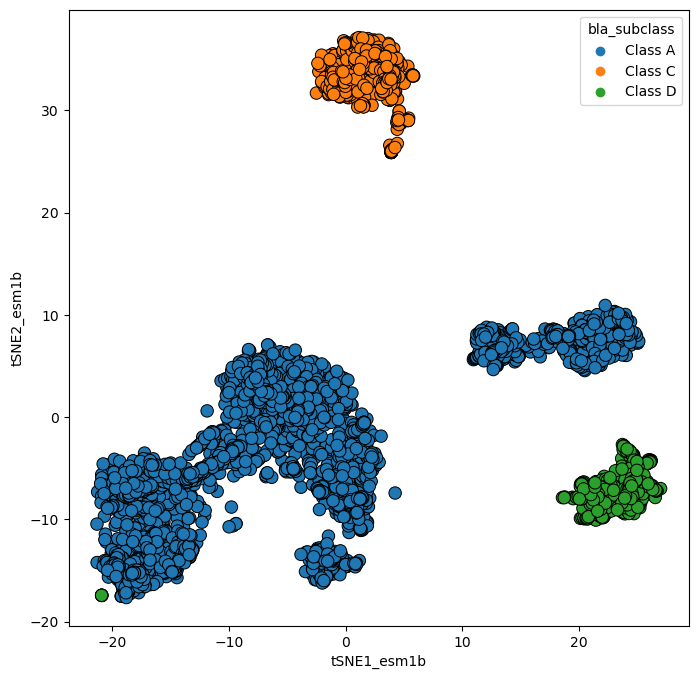

In [15]:
plt.figure(figsize=(8,8))
sns.scatterplot(data=df_sbl90, x="tSNE1_esm1b", y="tSNE2_esm1b", hue=c, palette=p, edgecolor=e, s = 80)

In [16]:
df_sbl90_a = df_sbl90[df_sbl90.bla_class.str.contains("Class A")].copy()


cluster_a = [
    "PER","VEB","CSP","SPU","CME","CIA","CGA","TLA","TLA2","LUS","CfxA",
    "CepA", "CblA"
]

# estan todas
cluster_b = [
    "PME","SGM","GES","BEL"
]

# no estan: VHH VHW AmpC MP RHOCA RTG SEL PSE
# cambie OKP por OKP-A/B que no estan en la bldb
cluster_c = [
    "VHH","VHW","AmpC", "MP","RHOCA","LAP","SHV","OHIO","LEN",
    "OKP","TER","GIL","TEM", "RUB","RTG","SCO","SEL",
    "HER","PSE","AER", "CKO","MAL","PLES","CARB","PAL","HMS",
    "ORN", "KLUY", "FPH"
]

# no estan: BlaAZ BlaIII BlaY BlaF STRCE STRCL STRFR STRLA STRAL FAR STRCAO STRCA
cluster_d = [
    "CAD","BlaAZ", "ARL","ROB", "ACI","CBP","BCL","BlaIII","BlaP",
    "OIH","BlaY","BlaS","BlaF","STRCE", "STRCL","STRFR","STRLA",
    "STRAL","MAB","FAR","AST", "BlaC", "STRCAO","STRCA","R39"
]

# no estan: VCC CRS YENT K1
cluster_e = [
    "FRI","VCC","IMI","NMCA","SME","SFC","BIC","CRS","CRH","CRP","KPC",
    "PenB","PenA","LUT","PenL","BPS","PenI","MIN","DES","BES","ERP",
    "YENT","HugA","CumA","SMO","RAHN","FONA","SFO","KLUC",
    "CTX-M","KLUA","KLUG","SED","RIC","GRI","K1","OXY"
]

# todas si estan en la BLDB
cluster_f = [
    "XCC","BOR","AXC","PAD","BKC","GPC", "CzoA", "L2"
]

#cluster_no = [
#    'BcI', 'BRO', 'BBI', 'ASU1', 'BcIII', 'RPA', 'RSA1', 'RSA2', 
#    'SDA', 'FTU', 'GPA', 'RCP', 'FLC', 'FEC', 'DBA', 'PenP', 
#    'RAA', 'CST', 'CPA', 'CM1', 'CKA', 'VBR', 'CdiA', 'PC1', 
#    'PC2', 'PbbA', 'PSV', 'PLA', 'MIA', 'MM3', 'PAU', 'ORF6', 
#    'PenE', 'BlaA', 'AFA']

#cluster_x = [
#     "BRO","FTU", "FPH"
#]


filters = [
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_a)),
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_b)),
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_c)),
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_d)),
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_e)),
    df_sbl90_a.protein_family_header.str.contains("|".join(cluster_f)),
    # df_a.protein_family_header.str.contains("|".join(cluster_x)),
]

values = ["A","B", "C", "D", "E", "F", 
          #"x"
]

#    "Group C (LSBL; limited-spectrum beta-lactamases)",
#    "Group D (Gram positive)",
#    "Group E (WSBL; wider spectrum betalactamases)",
#    "Group F (Gram negative rods)",
#    "Group A (Subclass A2)"
   
df_sbl90_a["Group"] = np.select(filters, values)

df_sbl90_a["Group"] = df_sbl90_a.Group.str.replace("0","Unknown")
df_sbl90_a = df_sbl90_a.sort_values("Group")

In [ ]:
plt.figure(figsize=(8,8))
sns.scatterplot(data = df_sbl90_a.sort_values("Group", ascending=False),
                x = "tSNE1_esm1b", y =  "tSNE2_esm1b", hue = "Group", edgecolor=e, s = 80)

In [17]:
ls ../data/philippon/

genus_a.txt*  genus_d.txt*  species_a.txt*  species_d.txt*
genus_b.txt*  genus_e.txt*  species_b.txt*  species_e.txt*
genus_c.txt*  genus_f.txt*  species_c.txt*  species_f.txt*


In [18]:
df_sbl90_a_phil = df_sbl90_a.copy()
df_sbl90_a_phil = df_sbl90_a_phil.fillna("Unk")

# load spp 
with open('../data/philippon/species_a.txt', 'r') as f:
    species = f.readlines()
group_a_spp = []
for spp in species:
    group_a_spp.append(spp.rstrip())
    
    
# load spp 
with open('../data/philippon/species_b.txt', 'r') as f:
    species = f.readlines()
group_b_spp = []
for spp in species:
    group_b_spp.append(spp.rstrip())
    
    
# load spp 
with open('../data/philippon/species_c.txt', 'r') as f:
    species = f.readlines()
group_c_spp = []
for spp in species:
    group_c_spp.append(spp.rstrip())
  
    
# load spp 
with open('../data/philippon/species_d.txt', 'r') as f:
    species = f.readlines()
group_d_spp = []
for spp in species:
    group_d_spp.append(spp.rstrip())
    
    
# load spp 
with open('../data/philippon/species_e.txt', 'r') as f:
    species = f.readlines()
group_e_spp = []
for spp in species:
    group_e_spp.append(spp.rstrip())
    
    
# load spp 
with open('../data/philippon/species_f.txt', 'r') as f:
    species = f.readlines()
group_f_spp = []
for spp in species:
    group_f_spp.append(spp.rstrip())


filters = [
    df_sbl90_a_phil.Species.str.contains("|".join(group_a_spp)),
    df_sbl90_a_phil.Species.str.contains("|".join(group_b_spp)),
    df_sbl90_a_phil.Species.str.contains("|".join(group_c_spp)),
    df_sbl90_a_phil.Species.str.contains("|".join(group_d_spp)),
    df_sbl90_a_phil.Species.str.contains("|".join(group_e_spp)),
    df_sbl90_a_phil.Species.str.contains("|".join(group_f_spp))
]

values = ["A","B", "C", "D", "E", "F"]
   
df_sbl90_a_phil["Philippon"] = np.select(filters, values)

df_sbl90_a_phil["Philippon"] = df_sbl90_a_phil.Philippon.str.replace("0","Unknown")
df_sbl90_a_phil = df_sbl90_a_phil.sort_values("Philippon")

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

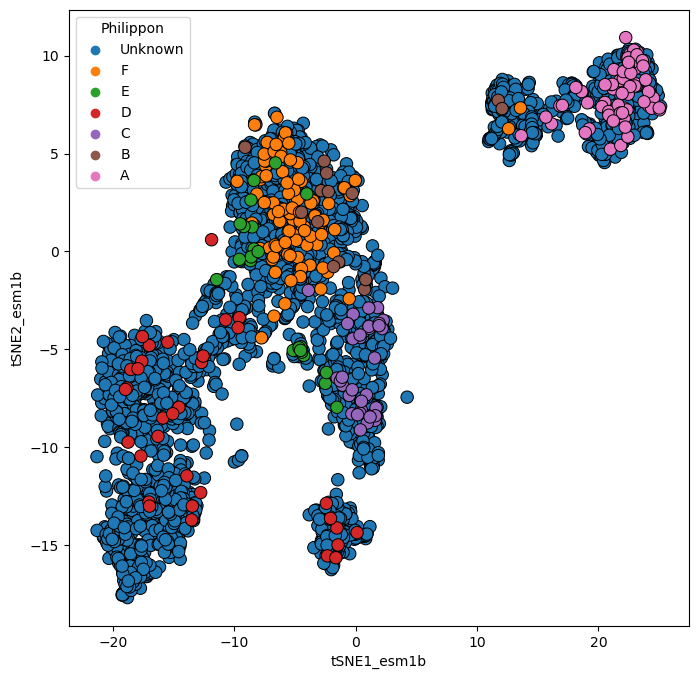

In [19]:
plt.figure(figsize=(8,8))
sns.scatterplot(data = df_sbl90_a_phil.sort_values("Philippon", ascending=False),
                x = "tSNE1_esm1b", y =  "tSNE2_esm1b", hue = "Philippon", edgecolor=e, s = 80)

In [20]:
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

for taxa in taxa_lst:
    top9 = list(df_sbl90_a[taxa].value_counts()[:9].index)
    df_sbl90_a.loc[~df_sbl90_a[taxa].isin(top9), taxa] = "Other"

In [21]:
df_sbl90_a["Domain"]  = df_sbl90_a.Domain.str.replace("d__", "")
df_sbl90_a["Phylum"]  = df_sbl90_a.Phylum.str.replace("p__", "")
df_sbl90_a["Class"]   = df_sbl90_a.Class.str.replace("c__", "")
df_sbl90_a["Order"]   = df_sbl90_a.Order.str.replace("o__", "")
df_sbl90_a["Family"]  = df_sbl90_a.Family.str.replace("f__", "")
df_sbl90_a["Genus"]   = df_sbl90_a.Genus.str.replace("g__", "")
df_sbl90_a["Species"] = df_sbl90_a.Species.str.replace("s__", "")

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

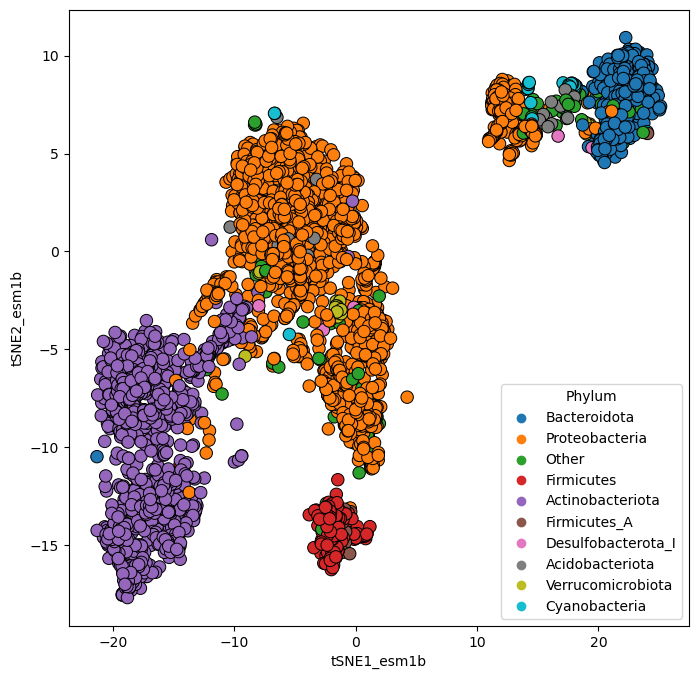

In [22]:
plt.figure(figsize=(8,8))
sns.scatterplot(data = df_sbl90_a,
                x = "tSNE1_esm1b", y =  "tSNE2_esm1b", hue = "Phylum", edgecolor=e, s = 80)

In [23]:
taxa_lst = ['Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species']

for taxa in taxa_lst:
    top9 = list(df_sbl90[taxa].value_counts()[:9].index)
    df_sbl90.loc[~df_sbl90[taxa].isin(top9), taxa] = "Other"

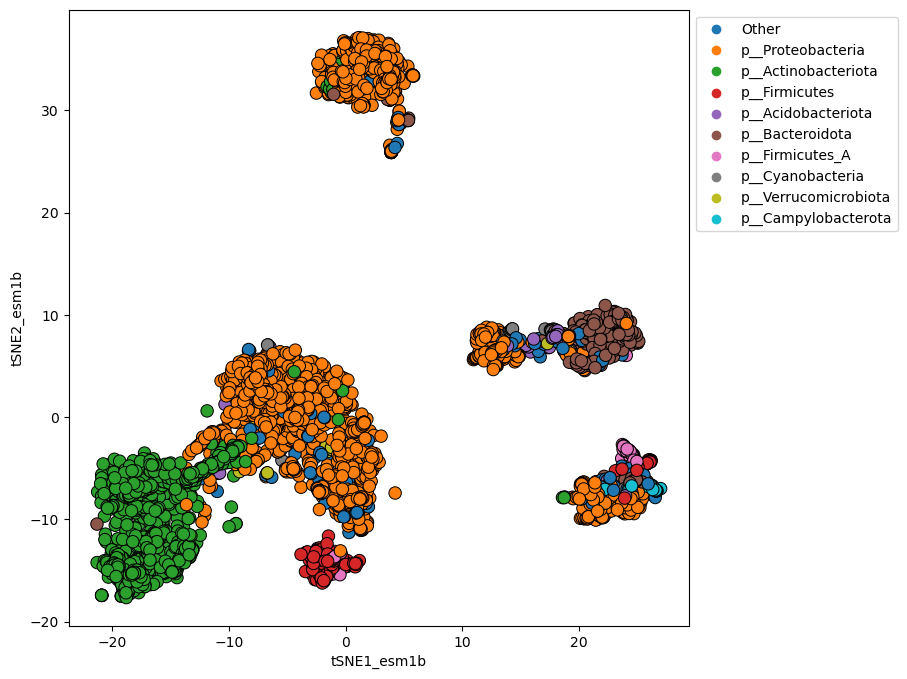

In [24]:
plt.figure(figsize=(8,8))
sns.scatterplot(data = df_sbl90, x = "tSNE1_esm1b", y =  "tSNE2_esm1b", hue = "Phylum", edgecolor=e, s = 80)
plt.legend(bbox_to_anchor=(1.001, 1), loc="upper left")

fin